## 3-1

In [1]:
# 사용하기 위한 라이브러리와 모듈 불러오기

import os # 파일, 디렉토리 작업 때 사용하는 모듈
import torch # pytorch 사용하기 위한 모듈
import random # 랜덤 모듈, 랜덤 값을 생성할 때 사용하는 모듈
import torchvision # 컴비터 비전 관련 모듈
import torchvision.transforms as transforms # 데이터 전처리 관련 모듈
# 데이터 로딩을 위한 dataloader,학습에서 특정 클래스나 데이터만을 사용해야 할 때, 사용하는 라이브러리
from torch.utils.data import DataLoader, Subset

import torch.nn as nn # 레이어 정의
import torch.optim as optim # 최적화 모듈
import torch.nn.functional as F # activation 모듈
from tqdm import tqdm # 진행사항 표시 모듈
from collections import Counter # 클래스별로 몇 개의 샘플이 있는지 카운팅 하기 위한 모듈

from sklearn.manifold import TSNE # 차원 축소 기법 tsne 사용하기 위한 모듈
from matplotlib.colors import ListedColormap # 색상 리스트를 부르기 위한 모듈
import matplotlib.pyplot as plt # 데이터 시각화, 그래프 그리는 모듈
import numpy as np # numpy 라이브러리

In [2]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # 여러 GPU를 사용하는 경우
    torch.backends.cudnn.deterministic = True  # CUDNN 비결정적 연산 방지
    torch.backends.cudnn.benchmark = False

# Seed 고정
set_seed(777)

In [3]:
class ResnetBlock(nn.Module):
    def __init__(self, input_c, output_c, stride = 1):
        # resnetblock 함수
        # input_c = 입력 채널, output_c = 출력 채널, stride = stride 크기
        super(ResnetBlock, self).__init__()
        
        # 첫 번째 convolution layer = 3 x 3 커널, padding = 1을 이용해서 입력과 동일한 크기 출력을 만듦
        self.conv1 = nn.Conv2d(input_c, output_c, kernel_size = 3, stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(output_c)
        
        # 두 번째 convolution layer = 3 x 3 커널, padding = 1을 이용해서 입력과 동일한 크기 출력을 만듦
        self.conv2 = nn.Conv2d(output_c, output_c, kernel_size = 3, stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(output_c)
        
        # skip connection
        # 입력과 출력의 차원이 다르거나 stride가 1이 아닐 때, skip connection 추가
        self.skip = nn.Sequential()
        if stride != 1 or input_c != output_c:
            # 입력의 차원을 맞추기 위해 1 x 1 conv layer 사용
            self.skip = nn.Sequential(
                nn.Conv2d(input_c, output_c, kernel_size = 1, stride = stride, bias = False),
                nn.BatchNorm2d(output_c)
            )
            
    def forward(self, x):
        # relu
        output = F.relu(self.bn1(self.conv1(x)))
        
        # batchnorm
        output = self.bn2(self.conv2(output))
        
        # skip connection
        output += self.skip(x)
        
        # relu
        output = F.relu(output)
        
        return output

In [4]:
class Resnet(nn.Module):
    def __init__(self, block, num_blocks, num_classes = 10):
        # block = resnet 블록, num_blocks = 각 layer에서 사용할 블럭의 수, num_classes = cifar10  클래스 수
        super(Resnet, self).__init__()
        # 입력 채널 수
        self.input_c = 64
        
        # 첫 번째 convolution layer = 3 x 3 커널, 입력 채널은 cifar10이 rgb 이미지 이므로 3, 출력은 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size = 3, stride = 1, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(64)
        
        # 각 레이어를 만들기 위한 블록 구성
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride = 1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride = 2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride = 2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride = 2)
        
        self.linear = nn.Linear(512, num_classes)
        
    def _make_layer(self, block, output_c, num_blocks, stride):
        # 레이어를 구성하는 함수
        # block = 사용할 블록, output_c = 출력 채널, num_blocks = 레이어에서 사용할 블록 수
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            # resnet 블록 추가하고 입력 채널 수를 업데이트
            layers.append(block(self.input_c, output_c, stride))
            # 다음 블록의 입력 채널 수는 현재 출력 채널 수와 동일
            self.input_c = output_c
            
        # 레이어를 순차적으로 변환
        return nn.Sequential(*layers)
    
    def forward(self, x):
        # 순전파
        # relu
        output = F.relu(self.bn1(self.conv1(x)))
        
        # 각 레이어를 차례대로 통과 --> 연결된 블록들
        output = self.layer1(output)
        output = self.layer2(output)
        output = self.layer3(output)
        output = self.layer4(output)
        
        # average pooling = 출력 텐서 크기를 줄임 (4 x 4)
        output = F.avg_pool2d(output, 4)
        
        # 출력을 1차원 벡터로 변환
        output = output.view(output.size(0), -1)
    
        output = self.linear(output)
        
        return output

In [5]:
def ResNet18():
    # resnet18 모델을 생성하는 함수
    # resnet18 구조는 4개의 layer 그룹으로 되어 있는데, 각 그룹은 2개의 resnetblock을 포함
    
    # resnet 클래스를 호출해서 resnet18 모델을 만들고 반환
    # resnetblock = resnet 블록 구조를 정의하는 클래스
    # [2, 2, 2, 2] = 각 layer 그룹에서 사용할 resnetblock의 수
    return Resnet(ResnetBlock, [2, 2, 2, 2])

In [6]:
# data augmentation
train_transform = transforms.Compose([
    # 이미지를 tensor로 변환, 이미지 값이 0~1 사이로 스케일링
    transforms.ToTensor(),
    # 이미지의 RGB 채널 값을 평균, 표준편차로 정규화
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [7]:
# cifar10 데이터 다운로드

train_dataset = torchvision.datasets.CIFAR10(root = './Boundary_Unlearning_task_data', train = True, download = True, transform = train_transform)
test_dataset = torchvision.datasets.CIFAR10(root = './Boundary_Unlearning_task_data', train = False, download = True, transform = test_transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size = 64, shuffle = True, num_workers = 4)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size = 64, shuffle = False, num_workers = 4)

Files already downloaded and verified
Files already downloaded and verified


In [8]:
len(train_dataset), len(test_dataset)

(50000, 10000)

In [9]:
# gpu가 사용 가능한지 확인 --> 가능하면 첫 번째 gpu를 사용하고 아니면 cpu 사용
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=3)

In [10]:
# 잊고자 하는 클래스
forget_class = 0

# forget class에 해당하는 인덱스 저장 --> 클래스 0에 해당하는 데이터 인덱스만 리스트에 저장
train_forgetset_split = [i for i, (_, label) in enumerate(train_dataset) if label == forget_class]
# forget class에 해당하지 않는 인덱스 저장 --> 클래스 0을 제외한 데이터 인덱스만 레스트에 저장
train_remainset_split = [i for i, (_, label) in enumerate(train_dataset) if label != forget_class]

In [11]:
# forget class에 해당하는 인덱스 저장 --> 클래스 0에 해당하는 데이터 인덱스만 리스트에 저장
test_forgetset_split = [i for i, (_, label) in enumerate(test_dataset) if label == forget_class]
# forget class에 해당하지 않는 인덱스 저장 --> 클래스 0을 제외한 데이터 인덱스만 레스트에 저장
test_remainset_split = [i for i, (_, label) in enumerate(test_dataset) if label != forget_class]

In [12]:
# 학습 중 잊어야 하는 데이터만 추출한 데이터셋
train_forgetset = Subset(train_dataset, train_forgetset_split)
# 학습 중 잊어야 하는 데이터를 제외한 데이터셋
train_remainset = Subset(train_dataset, train_remainset_split)
# 테스트 중 잊어야 하는 데이터만 추출한 데이터셋
test_forgetset = Subset(test_dataset, test_forgetset_split)
# 테스트 중 잊어야 하는 데이터를 제외한 데이터셋
test_remainset = Subset(test_dataset, test_remainset_split)

In [13]:
len(train_forgetset), len(train_remainset), len(test_forgetset), len(test_remainset)

(5000, 45000, 1000, 9000)

In [14]:
train_remain_loader = DataLoader(train_remainset, batch_size = 64, shuffle = True)
train_forget_loader = DataLoader(train_forgetset, batch_size = 64, shuffle = True)
test_remain_loader = DataLoader(test_remainset, batch_size = 64, shuffle = False)
test_forget_loader = DataLoader(test_forgetset, batch_size = 64, shuffle = False)

In [15]:
def extract_emb(model, dataloader, device):
    # 모델을 평가모드로 설정 --> 학습 중에 발생하는 것 비활성화 ex) batch normalization
    model.eval()
    emb = []
    all_label = []
    
    # 모델이 가중치를 업데이트 하지 않도록 설정
    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            # 데이터와 정답 정보들을 정한 device로 이동 --> cpu or gpu
            batch_images, batch_labels = batch_images.to(device), batch_labels.to(device)
            
            # 모델을 통해서 결과값 추출
            features = model(batch_images)
            
            # 결과값 저장
            emb.append(features.cpu().numpy())
            all_label.append(batch_labels.cpu().numpy())
            
    # 모든 배치의 데이터를 연결해서 numpy 배열로 변환
    emb = np.concatenate(emb)
    all_label = np.concatenate(all_label)
    
    return emb, all_label

In [16]:
def visualization_emb_remain(embs, labels):
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(embs)
    
    # 9개의 클래스를 시각화하기 위해 tab10 컬러맵의 9개만 사용
    cmap = ListedColormap(plt.cm.tab10.colors[:9])
    
    classes = list(set(labels))
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 축소한 데이터를 2차원으로 시각화 --> 점으로 시각화
    scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c = labels, cmap = cmap, alpha = 0.4)

    plt.legend(loc = 'lower right')
    plt.axis('off')
    # plt.colorbar(scatter)
    plt.title('cifar10_using_9_classes_remain')
    plt.show()

In [17]:
def visualization_emb_forget(embs, labels):
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(embs)
    
    classes = list(set(labels))
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 랜덤 정답으로 선정된 각 클래스에 대해 반복
    for i in classes:
        scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c = labels, cmap = 'jet', label = f'class {i}', alpha = 0.4)
    
    plt.legend(loc = 'lower right')
    plt.axis('off')
    # plt.colorbar(scatter)
    plt.title('cifar10_using_9_classes_forget')
    plt.show()

In [18]:
# remain 데이터와 forget 데이터에 대해 시각화 하는 함수
# emb_remain = 남은 데이터
# emb_forget = 잊을 데이터
# remain_labels = 남은 데이터에 맞는 정답
# forget_labels = 잊을 데이터에 맞는 정답

def visualization_emb_com(emb_remain, emb_forget, remain_labels, forget_labels):
    # 남은 데이터와 잊을 데이터를 행 방향으로 합쳐서 배열을 만듦
    comb_emb = np.concatenate([emb_remain, emb_forget], axis = 0)
    comb_label = np.concatenate([remain_labels, forget_labels], axis = 0)
    
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(comb_emb)
    
    # 남은 데이터는 tab10의 색상 중 9개만 사용
    cmap1 = ListedColormap(plt.cm.tab10.colors[:9])
    # 잊을 데이터는 그 이외의 색상을 사용
    cmap2 = ListedColormap(plt.cm.tab10.colors[9:])
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 축소한 데이터를 2차원으로 시각화 --> 점으로 시각화
    remain_scatter = plt.scatter(reduced_data[:len(emb_remain), 0], reduced_data[:len(emb_remain), 1], 
                                 c = remain_labels, cmap = cmap1, alpha = 0.4, label = 'remain', marker = 'o')
    forget_scatter = plt.scatter(reduced_data[len(emb_remain):, 0], reduced_data[len(emb_remain):, 1], 
                                 c = forget_labels, cmap = cmap2, alpha = 0.8, label = 'forget', marker = 'x')
    
    plt.legend()
    plt.axis('off')
    # plt.colorbar(remain_scatter)
    # plt.colorbar(forget_scatter)
    # plt.colorbar(scatter, ticks = range(10))
    plt.title('cifar10_using_remain_forget_decision_space')
    plt.show()

In [19]:
# pgd 공격을 선언하는 함수
# 공격하려는 모델, 모델에 입력될 이미지, 정답, 공격 강도, 업데이터에서 더해지는 값, 공격 적용하는 반복 횟수
def pgd_attack(model, images, labels, epsilon = 0.3, alpha = 0.01, iterations = 40, device = 'cuda'):
    # 원본 이미지를 복제
    original_images = images.clone().detach().to(device)
    # 원본 이미지를 다시 복제 --> 이 이미지를 기반으로 공격을 적용한 데이터 생성
    images = original_images.clone().detach().to(device)
    
    # 적대적 공격을 적용하기 위한 기울기 계산 활성화
    images.requires_grad = True
    
    # 동일한 위치로 이동
    labels = labels.to(device)
    
    criterion = nn.CrossEntropyLoss()
    
    # iteration 수 만큼 데이터를 생성하기 위한 반복
    for _ in range(iterations):
        # 이전 반복에서 계산된 기울기 초기화 --> 하지 않으면 잘못된 결과 나올 수 있음
        if images.grad is not None:
            images.grad.zero_()
            
        # 입력을 통해서 결과를 출력
        logit_output = model(images)
        
        # 예측값과 정답 간의 loss
        loss = criterion(logit_output, labels)
        # 기울기 계산
        loss.backward()
        
        # 이미지에 노이즈를 추가하는 부분 
        # --> imagse.grad.sign()은 loss에 대한 이미지 기울기를 구하고 alpha를 곱해서 노이즈 생성
        adv_image = images + alpha * images.grad.sign()
        
        # 노이즈를 생성한 이미지에서 원본 이미지를 빼고 그 차이를 epsilon 범위 안에서 정해줌
        # 너무 다른 이미지를 만드는 것을 방지 하기 위함
        eta = torch.clamp(adv_image - original_images, min =- epsilon, max = epsilon)
        
        # 노이즈를 추가한 이미지를 원본에 더하고 0~1 사이의 값을 표현
        images = torch.clamp(original_images + eta, min = 0, max = 1).detach()
        
        # 기울기 계산을 위해 사용
        images.requires_grad = True
        
    return images

In [20]:
# boundary shrink를 적용하는 함수
# 경계를 줄이기 위한 모델, 잊어야 할 데이터셋(pgd를 적용해서 경계 밖으로 밀어낼 데이터)
def boundary_shrink(model, forgetdataset, epsilon, alpha, iterations, device):
    # 모델을 평가 모드 --> 기울기 계산 비활성화
    model.eval()
    updated_forgetdata = []
    
    # 이미지와 정답을 하나씩 배치 단위로 불러옴
    for images, labels in forgetdataset:
        images, labels = images.to(device), labels.to(device)
        
        # pgd을 적용하여 이미지 생성, 기존의 forgetdataset에서 학습한 내용을 경계 밖으로 밀어냄
        adv_images = pgd_attack(model, images, labels, epsilon = epsilon, alpha = alpha, 
                                iterations = iterations, device = device)
        
        # 기울기 계산을 사용하지 않음
        with torch.no_grad():
            # pgd를 적용한 이미지를 통해 얻은 결과
            logit_output = model(adv_images)
            
            # 모델의 출력값에서 가장 높은 값을 갖는 차원을 따라 새로운 정답을 예측
            new_labels = torch.argmax(logit_output, dim = 1)
        
        # pgd가 적용된 이미지의 새로운 라벨이랑 같이 저장
        updated_forgetdata.extend([(image.cpu(), label.cpu()) for image, label in zip(images, new_labels)])
        
    return updated_forgetdata

start training epoch  1


100%|██████████| 141/141 [00:05<00:00, 25.35it/s]


[epoch][1 / 30], train_loss : 1.6745, train_accuracy : 38.3156, test_loss : 1.5367, test_accuracy : 44.0556%
new acc : 44.06%, save model !
visualization decision space 1


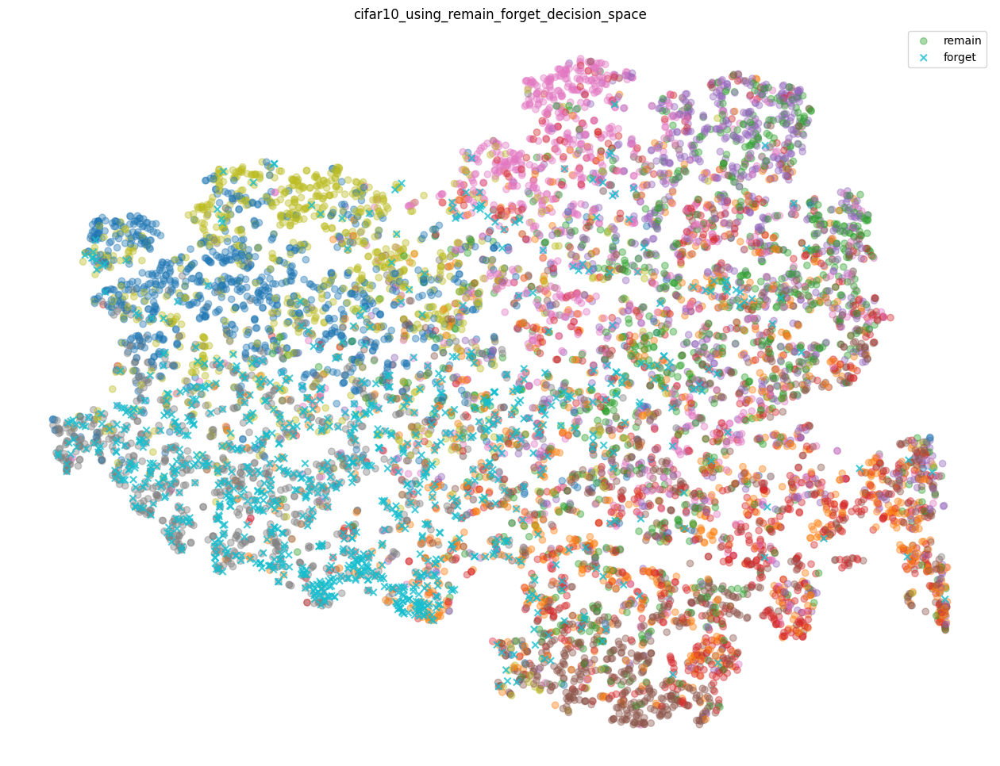

start training epoch  2


100%|██████████| 141/141 [00:05<00:00, 24.55it/s]


[epoch][2 / 30], train_loss : 1.1831, train_accuracy : 56.3178, test_loss : 1.0241, test_accuracy : 62.1556%
new acc : 62.16%, save model !
start training epoch  3


100%|██████████| 141/141 [00:05<00:00, 25.16it/s]


[epoch][3 / 30], train_loss : 0.9117, train_accuracy : 67.0378, test_loss : 0.8633, test_accuracy : 69.0000%
new acc : 69.00%, save model !
start training epoch  4


100%|██████████| 141/141 [00:05<00:00, 25.26it/s]


[epoch][4 / 30], train_loss : 0.7571, train_accuracy : 72.7267, test_loss : 0.8108, test_accuracy : 71.4889%
new acc : 71.49%, save model !
start training epoch  5


100%|██████████| 141/141 [00:05<00:00, 25.28it/s]


[epoch][5 / 30], train_loss : 0.6359, train_accuracy : 77.0822, test_loss : 0.7204, test_accuracy : 74.7222%
new acc : 74.72%, save model !
visualization decision space 5


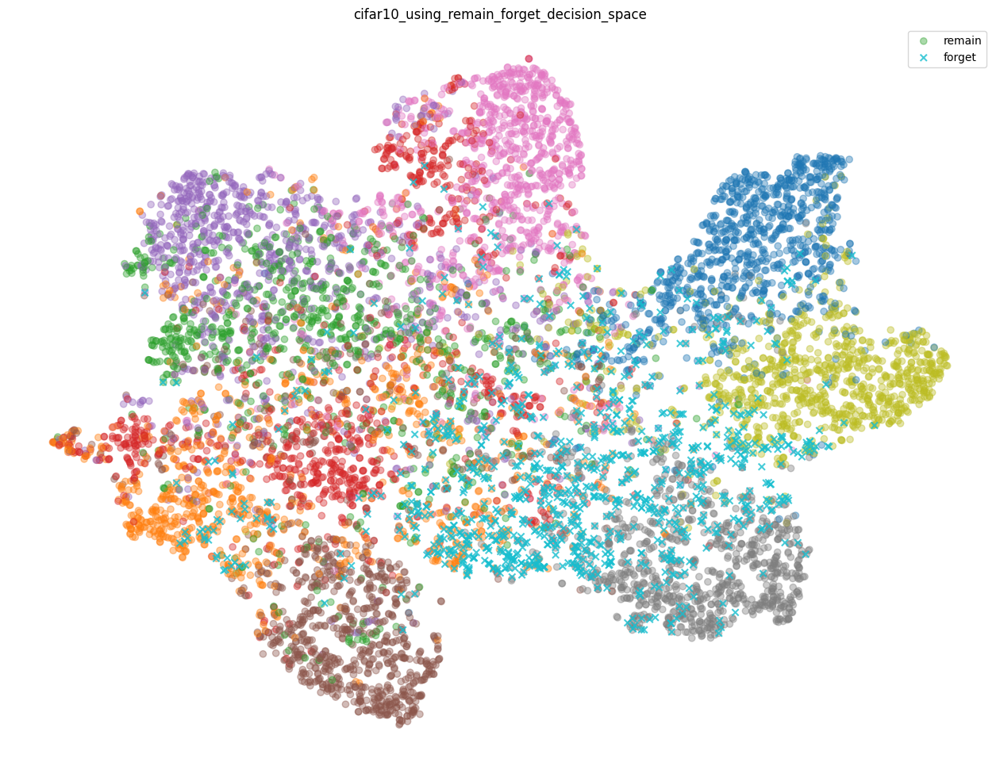

start training epoch  6


100%|██████████| 141/141 [00:05<00:00, 24.61it/s]


[epoch][6 / 30], train_loss : 0.5234, train_accuracy : 81.3200, test_loss : 0.6873, test_accuracy : 77.0444%
new acc : 77.04%, save model !
start training epoch  7


100%|██████████| 141/141 [00:05<00:00, 25.12it/s]


[epoch][7 / 30], train_loss : 0.4228, train_accuracy : 84.9156, test_loss : 0.6980, test_accuracy : 77.0000%
start training epoch  8


100%|██████████| 141/141 [00:05<00:00, 25.28it/s]


[epoch][8 / 30], train_loss : 0.3295, train_accuracy : 88.3267, test_loss : 0.6375, test_accuracy : 79.9889%
new acc : 79.99%, save model !
start training epoch  9


100%|██████████| 141/141 [00:05<00:00, 24.99it/s]


[epoch][9 / 30], train_loss : 0.2589, train_accuracy : 90.8600, test_loss : 0.6524, test_accuracy : 80.4778%
new acc : 80.48%, save model !
start training epoch  10


100%|██████████| 141/141 [00:05<00:00, 25.26it/s]


[epoch][10 / 30], train_loss : 0.2036, train_accuracy : 92.8533, test_loss : 0.6845, test_accuracy : 80.6000%
new acc : 80.60%, save model !
visualization decision space 10


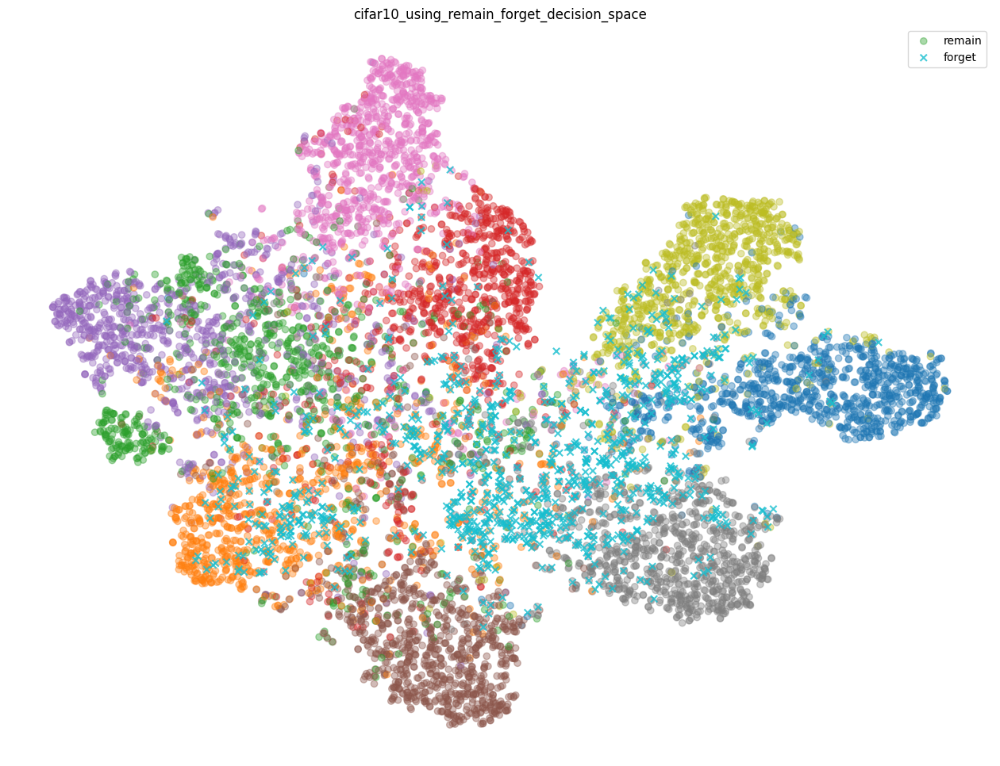

start training epoch  11


100%|██████████| 141/141 [00:05<00:00, 24.65it/s]


[epoch][11 / 30], train_loss : 0.1553, train_accuracy : 94.3556, test_loss : 0.7501, test_accuracy : 81.5111%
new acc : 81.51%, save model !
start training epoch  12


100%|██████████| 141/141 [00:05<00:00, 25.29it/s]


[epoch][12 / 30], train_loss : 0.1101, train_accuracy : 96.0267, test_loss : 0.7031, test_accuracy : 82.0333%
new acc : 82.03%, save model !
start training epoch  13


100%|██████████| 141/141 [00:05<00:00, 25.30it/s]


[epoch][13 / 30], train_loss : 0.0841, train_accuracy : 97.1067, test_loss : 0.8646, test_accuracy : 80.7222%
start training epoch  14


100%|██████████| 141/141 [00:05<00:00, 25.35it/s]


[epoch][14 / 30], train_loss : 0.0785, train_accuracy : 97.2489, test_loss : 0.8231, test_accuracy : 81.8556%
start training epoch  15


100%|██████████| 141/141 [00:04<00:00, 28.68it/s]


[epoch][15 / 30], train_loss : 0.0477, train_accuracy : 98.3556, test_loss : 0.8759, test_accuracy : 82.1333%
new acc : 82.13%, save model !
visualization decision space 15


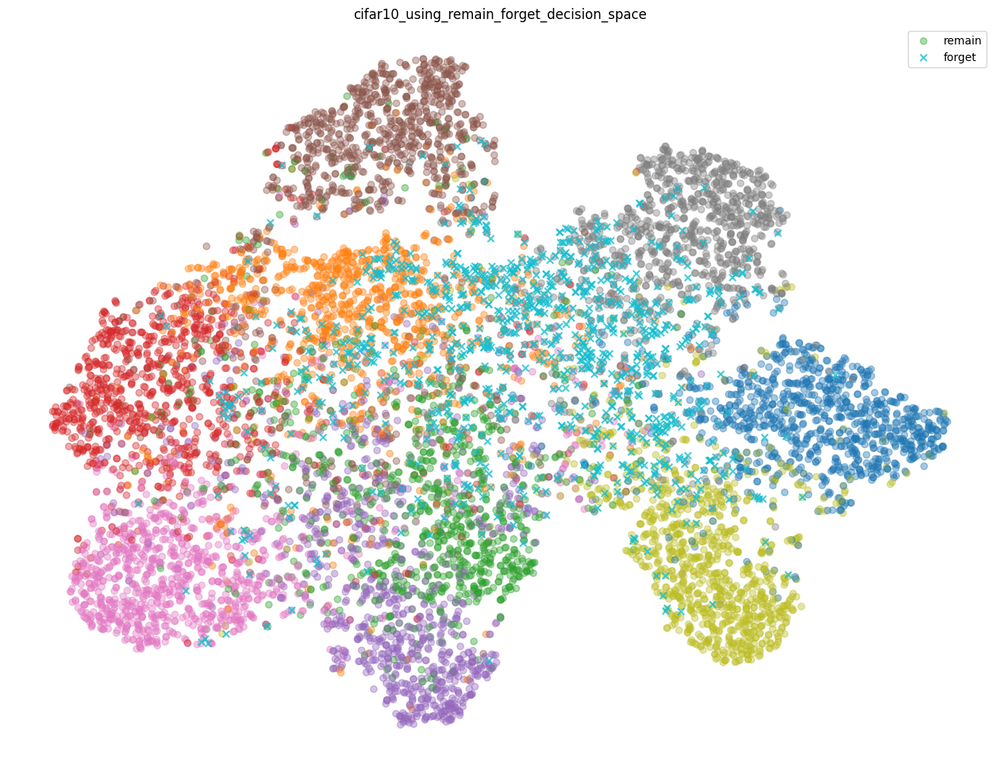

start training epoch  16


100%|██████████| 141/141 [00:05<00:00, 24.60it/s]


[epoch][16 / 30], train_loss : 0.0397, train_accuracy : 98.5933, test_loss : 0.8488, test_accuracy : 83.1889%
new acc : 83.19%, save model !
start training epoch  17


100%|██████████| 141/141 [00:05<00:00, 25.13it/s]


[epoch][17 / 30], train_loss : 0.0363, train_accuracy : 98.7889, test_loss : 0.9229, test_accuracy : 82.9222%
start training epoch  18


100%|██████████| 141/141 [00:05<00:00, 25.32it/s]


[epoch][18 / 30], train_loss : 0.0433, train_accuracy : 98.5156, test_loss : 0.9541, test_accuracy : 82.4667%
start training epoch  19


100%|██████████| 141/141 [00:05<00:00, 25.28it/s]


[epoch][19 / 30], train_loss : 0.0229, train_accuracy : 99.2244, test_loss : 0.9613, test_accuracy : 83.1222%
start training epoch  20


100%|██████████| 141/141 [00:05<00:00, 25.36it/s]


[epoch][20 / 30], train_loss : 0.0189, train_accuracy : 99.3556, test_loss : 1.0063, test_accuracy : 82.6889%
visualization decision space 20


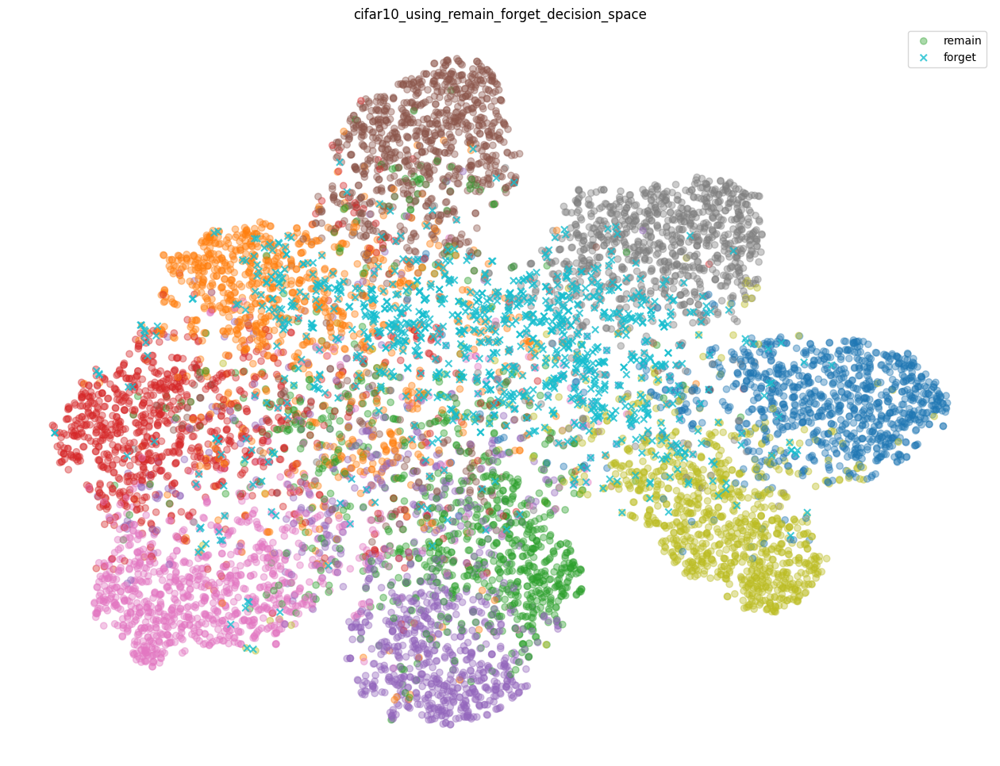

start training epoch  21


100%|██████████| 141/141 [00:05<00:00, 24.78it/s]


[epoch][21 / 30], train_loss : 0.0142, train_accuracy : 99.4978, test_loss : 1.0178, test_accuracy : 83.5556%
new acc : 83.56%, save model !
start training epoch  22


100%|██████████| 141/141 [00:04<00:00, 28.31it/s]


[epoch][22 / 30], train_loss : 0.0190, train_accuracy : 99.3733, test_loss : 1.0982, test_accuracy : 81.4111%
start training epoch  23


100%|██████████| 141/141 [00:05<00:00, 25.28it/s]


[epoch][23 / 30], train_loss : 0.0419, train_accuracy : 98.6244, test_loss : 0.9694, test_accuracy : 83.2444%
start training epoch  24


100%|██████████| 141/141 [00:05<00:00, 25.28it/s]


[epoch][24 / 30], train_loss : 0.0189, train_accuracy : 99.3689, test_loss : 0.9513, test_accuracy : 83.4000%
start training epoch  25


100%|██████████| 141/141 [00:05<00:00, 25.39it/s]


[epoch][25 / 30], train_loss : 0.0103, train_accuracy : 99.6644, test_loss : 1.0240, test_accuracy : 82.9556%
visualization decision space 25


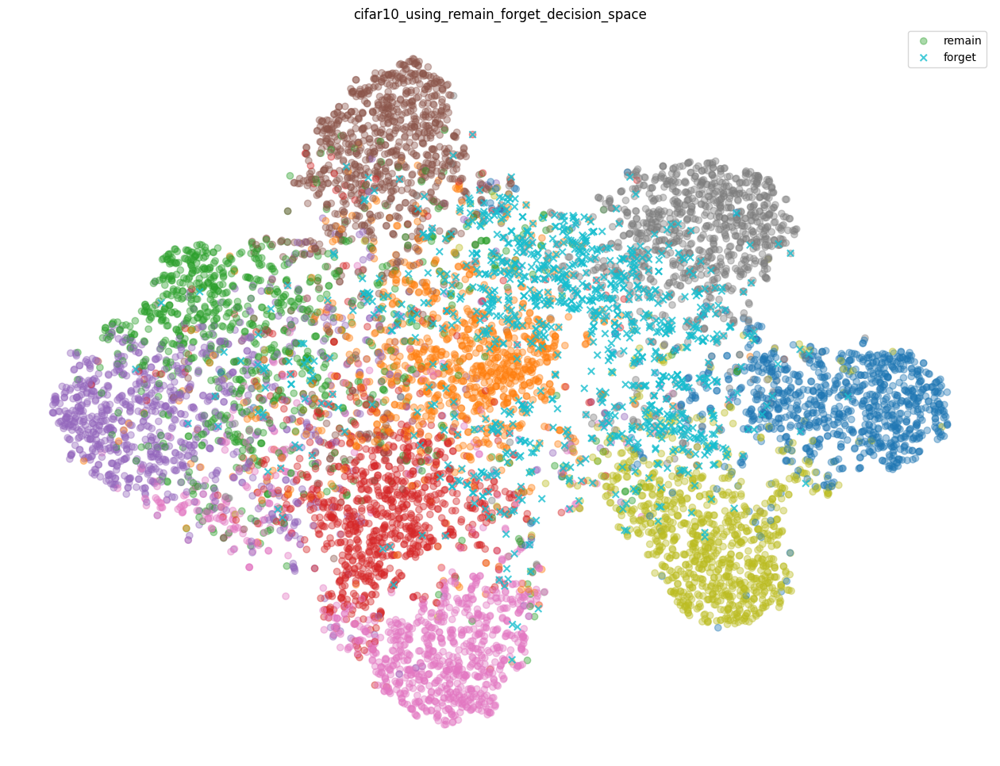

start training epoch  26


100%|██████████| 141/141 [00:05<00:00, 24.50it/s]


[epoch][26 / 30], train_loss : 0.0062, train_accuracy : 99.7933, test_loss : 1.0482, test_accuracy : 84.0889%
new acc : 84.09%, save model !
start training epoch  27


100%|██████████| 141/141 [00:05<00:00, 25.25it/s]


[epoch][27 / 30], train_loss : 0.0056, train_accuracy : 99.8378, test_loss : 1.1196, test_accuracy : 83.5000%
start training epoch  28


100%|██████████| 141/141 [00:05<00:00, 27.69it/s]


[epoch][28 / 30], train_loss : 0.0311, train_accuracy : 98.9889, test_loss : 0.9802, test_accuracy : 83.4111%
start training epoch  29


100%|██████████| 141/141 [00:05<00:00, 25.29it/s]


[epoch][29 / 30], train_loss : 0.0099, train_accuracy : 99.6711, test_loss : 1.0363, test_accuracy : 83.1889%
start training epoch  30


100%|██████████| 141/141 [00:05<00:00, 25.36it/s]


[epoch][30 / 30], train_loss : 0.0111, train_accuracy : 99.6533, test_loss : 0.9918, test_accuracy : 83.8333%
visualization decision space 30


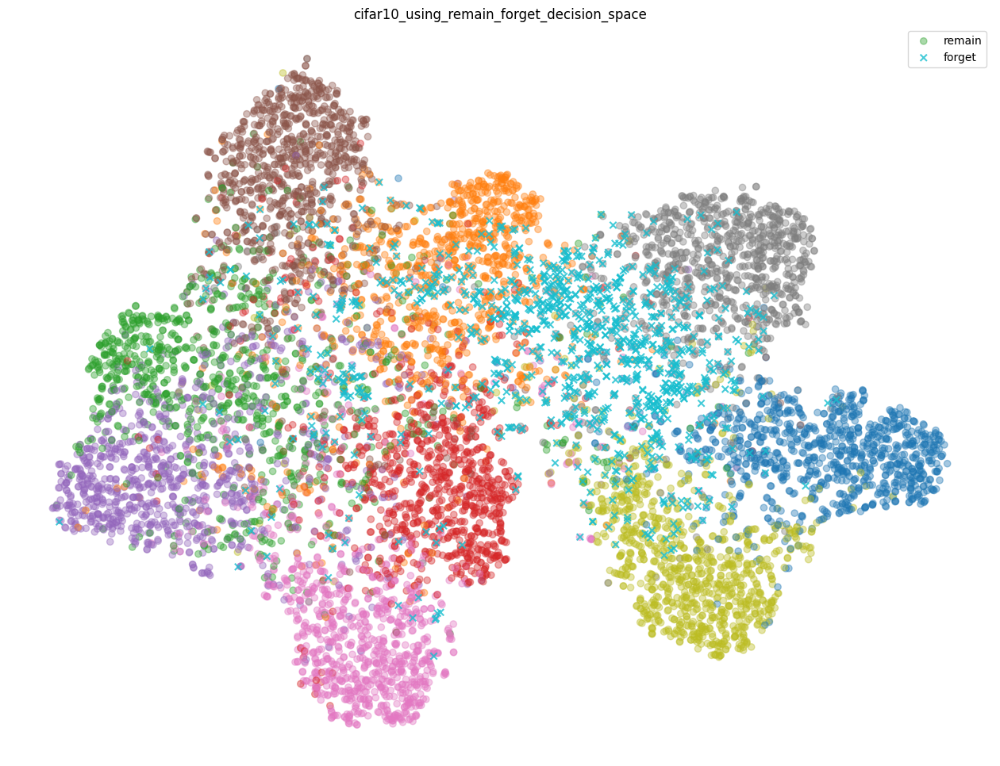

start finetuning


100%|██████████| 79/79 [00:06<00:00, 11.95it/s]


[epoch][1 / 10], fine_tuning_loss: 13.8341, fine_tuning_accruacy: 11.2800


100%|██████████| 79/79 [00:06<00:00, 11.97it/s]


[epoch][2 / 10], fine_tuning_loss: 13.3167, fine_tuning_accruacy: 11.8200


100%|██████████| 79/79 [00:06<00:00, 11.96it/s]


[epoch][3 / 10], fine_tuning_loss: 12.8010, fine_tuning_accruacy: 12.6000


100%|██████████| 79/79 [00:06<00:00, 11.88it/s]


[epoch][4 / 10], fine_tuning_loss: 12.3263, fine_tuning_accruacy: 13.8000


100%|██████████| 79/79 [00:07<00:00, 10.64it/s]


[epoch][5 / 10], fine_tuning_loss: 11.8384, fine_tuning_accruacy: 14.8200


100%|██████████| 79/79 [00:07<00:00, 10.58it/s]


[epoch][6 / 10], fine_tuning_loss: 11.4374, fine_tuning_accruacy: 15.5000


100%|██████████| 79/79 [00:07<00:00, 10.59it/s]


[epoch][7 / 10], fine_tuning_loss: 11.0402, fine_tuning_accruacy: 16.4400


100%|██████████| 79/79 [00:07<00:00, 10.59it/s]


[epoch][8 / 10], fine_tuning_loss: 10.5972, fine_tuning_accruacy: 17.7000


100%|██████████| 79/79 [00:07<00:00, 10.59it/s]


[epoch][9 / 10], fine_tuning_loss: 10.1659, fine_tuning_accruacy: 18.7600


100%|██████████| 79/79 [00:07<00:00, 10.59it/s]


[epoch][10 / 10], fine_tuning_loss: 9.7066, fine_tuning_accruacy: 19.6200
visualization decision space finetuning 10


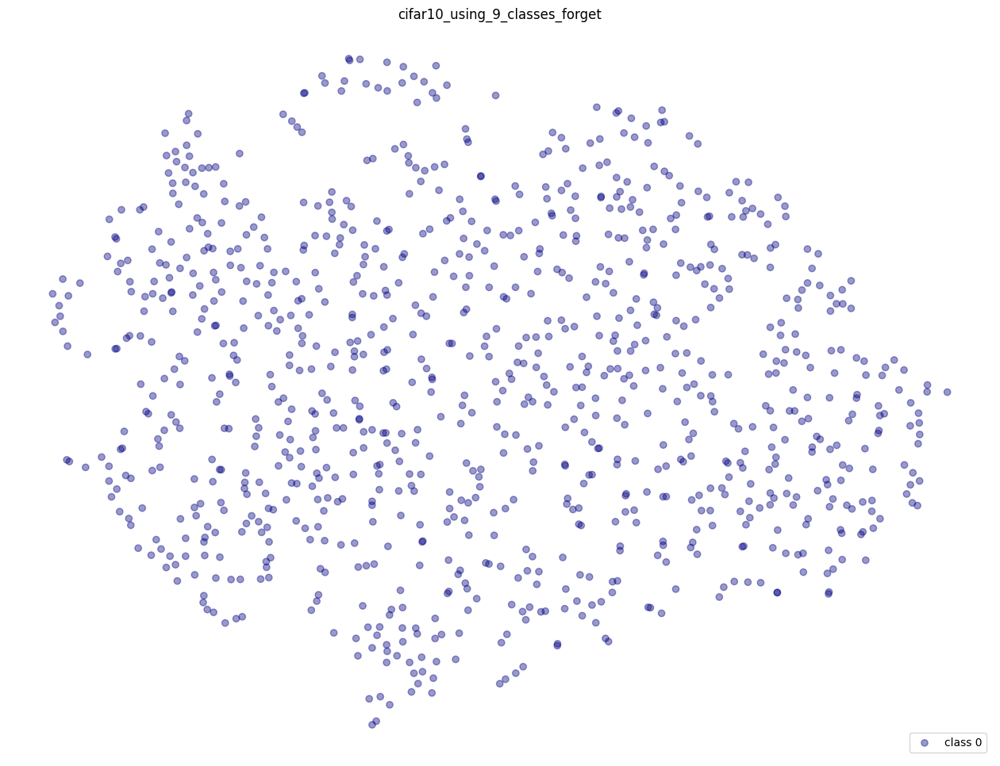

forgetset accuracy after fine_tuning : 18.20%
remainset accuracy after fine_tuning : 77.83%
visualization decision space


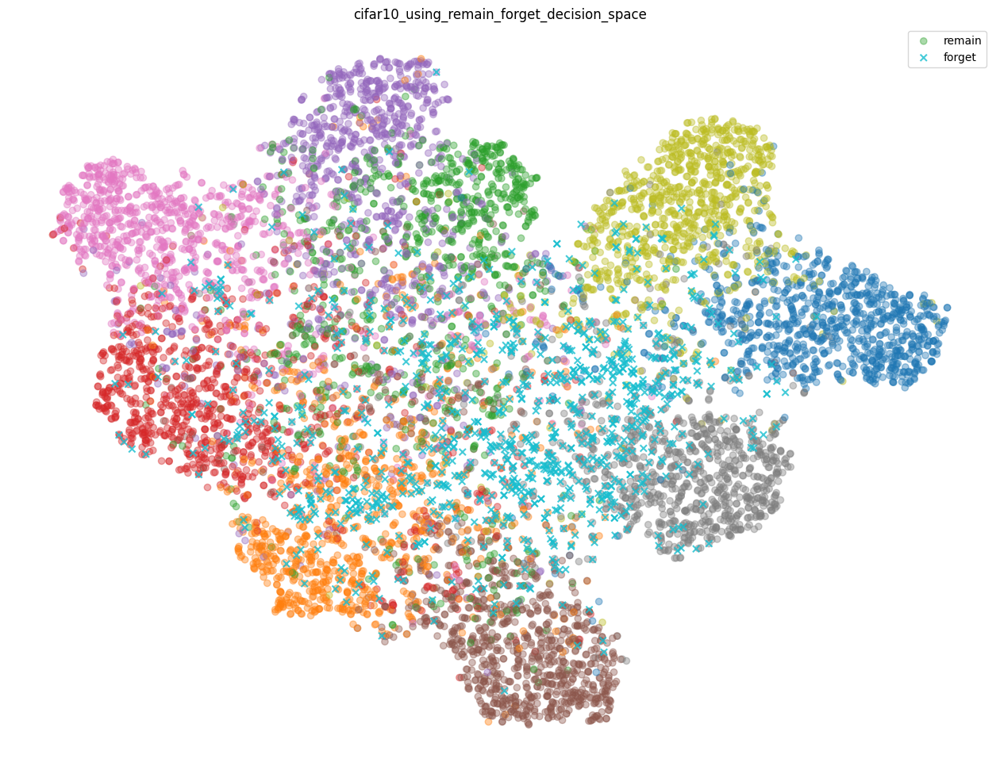

In [22]:
# 모델 선언
model = ResNet18().to(device)
# model = resnet18.to(device)

# pt를 저장하기 위한 폴더 생성
pt_folder_name = 'Boundary_Unlearning_task2_pt'
os.makedirs(pt_folder_name, exist_ok = True)

# 모델의 가장 높은 정확도를 기록하기 위한 변수
best_accuracy = 0.

# 분류 문제에서 자주 사용하는 손실 함수
criterion = nn.CrossEntropyLoss()

# Stochastic Gradient Descent = 확률 경사 하강법
optimizer = optim.SGD(model.parameters(), lr = 0.1, momentum = 0.9)

print('shrink start')
train_forget_shrink = boundary_shrink(model, train_forget_loader, epsilon = 0.3, alpha = 0.01, iterations = 50, device = device)
train_shrinked_forget_loader = DataLoader(train_forget_shrink, batch_size = 64, shuffle = True)

test_forget_shrink = boundary_shrink(model, test_forget_loader, epsilon = 0.3, alpha = 0.01, iterations = 50, device = device)
test_shrinked_forget_loader = DataLoader(test_forget_shrink, batch_size = 64, shuffle = False)
print('shrink end')

# 학습 30 회
for epoch in range(1, 31):
    print("start training epoch ", epoch)
    
    # 학습 모드 설정, loss, 맞춘 수, 사용한 샘플 수
    model.train()
    train_total_loss = 0.
    train_total_count = 0.
    train_total_data = 0
    
    # 학습 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(train_remain_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 이전 배치에서 계산되 기울기 값 초기화
        optimizer.zero_grad()
        
        # 입력 데이터에 대한 예측
        logit_output = model(images)
        
        # 예측된 출려과 정답 간의 차이 계산
        loss = criterion(logit_output, labels)
        
        # 모델이 예측한 정답
        _, predict = torch.max(logit_output, 1)
        
        # 예측이 실제 정답과 일치하는 수
        check_count = (predict == labels).sum().item()
        
        train_total_loss += loss.item()
        train_total_count += check_count
        train_total_data += len(labels)
        
        # loss에 대한 모델의 가중치의 기울기 계산
        loss.backward()
        # 계산한 기울기를 이용하여 가중치 업데이트
        optimizer.step()
        
    # 학습 배치에서의 loss 평균
    train_avg_loss = train_total_loss / len(train_remain_loader)
    
    # 학습 배치에서의 정확도
    train_accuracy = train_total_count / train_total_data * 100
        
        
    # 평가 모드 설정, loss, 맞춘 수, 사용한 샘플 수
    model.eval()
    test_total_loss = 0.
    test_total_count = 0.
    test_total_data = 0
    
    # 테스트 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(test_remain_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 기울기 계산을 사용하지 않음
        with torch.no_grad():
            # 테스트 데이터로 모델의 예측값을 얻음
            logit_output = model(images)
            
            # 예측과 정답 사이의 loss 계산
            loss = criterion(logit_output, labels)
            
            # 모델이 예측한 정답을 얻음
            _, predict = torch.max(logit_output, 1)
            
            # 맞춘 샘플 수
            check_count = (predict == labels).sum().item()
            
            test_total_loss += loss.item()
            test_total_count += check_count
            test_total_data += len(labels)
    
    # 테스트 데이터에 대한 loss 평균           
    test_avg_loss = test_total_loss / len(test_remain_loader)
    # 테스트 데이터에 대한 정확도
    test_accuracy = test_total_count / test_total_data * 100
    
    print(f"[epoch][{epoch} / 30], train_loss : {train_avg_loss:.4f}, train_accuracy : {train_accuracy:.4f}, test_loss : {test_avg_loss:.4f}, test_accuracy : {test_accuracy:.4f}%")
    
    # 테스트 데이터가 가장 높은 경우 모델 저장
    if test_accuracy > best_accuracy:
        print(f"new acc : {test_accuracy:.2f}%, save model !")
        best_accuracy = test_accuracy
        model_save_path = os.path.join(pt_folder_name, f"resnet18_best_task2_1.pt")
        torch.save(model.state_dict(), model_save_path)
        
    if epoch == 1 or epoch % 5 == 0:
        print(f'visualization decision space {epoch}')
        remain_embs, remain_labels = extract_emb(model, test_remain_loader, device)
        forget_embs, forget_labels = extract_emb(model, test_forget_loader, device)
        visualization_emb_com(remain_embs, forget_embs, remain_labels, forget_labels)
        
# boundary shrink를 적용하여 만들어진 데이터를 이용하여 finetuning
print('start finetuning')
optimizer_f = optim.SGD(model.parameters(), lr = 0.00001, momentum = 0.9)

model.train()
# 학습 횟수 10회
for epoch in range(1, 11):
    # loss, 맞춘 수, 샘플 수
    fine_train_loss = 0.0
    fine_total_count = 0
    fine_total_data = 0
    
    # boundary shrink를 적용한 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(train_shrinked_forget_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 이전 배치에서 계산된 기울기 값 초기화
        optimizer_f.zero_grad()
        
        # boundary shrink를 적용한 데이터로 모델의 예측값을 얻음
        logit_output = model(images)
        
        # 예측과 정답 사이의 loss 계산
        loss = criterion(logit_output, labels)
        
        # 모델이 예측한 정답을 얻음
        _, fine_predict = torch.max(logit_output, 1)
        
        # 맞춘 샘플 수 
        check_count = (fine_predict == labels).sum().item()
        
        fine_train_loss += loss.item()
        fine_total_count += check_count
        fine_total_data += len(labels)
        
        # loss에 대한 모델의 가중치의 기울기 계산
        loss.backward()
        # 계산한 기울기를 이용하여 가중치 업데이트
        optimizer_f.step()
        
    # boundary shrink를 적용한 데이터에 대한 loss 평균  
    fine_avg_loss = fine_train_loss / len(train_shrinked_forget_loader)
    
    # boundary shrink를 적용한 데이터에 대한 정확도 
    fine_accuracy = fine_total_count / fine_total_data * 100
        
    print(f'[epoch][{epoch} / 10], fine_tuning_loss: {fine_avg_loss:.4f}, fine_tuning_accruacy: {fine_accuracy:.4f}')
    
    if epoch == 10:
        print(f'visualization decision space finetuning {epoch}')
        forget_embs, forget_labels = extract_emb(model, test_forget_loader, device)
        visualization_emb_forget(forget_embs, forget_labels)
    
# 평가 모드 설정
model.eval()

# boundary shrink를 적용한 데이터에 대한 추론 준비
forget_correct = 0
forget_total_data = 0

# boundary shrink를 적용한 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력

for images, labels in test_shrinked_forget_loader:
    images, labels = images.to(device), labels.to(device)
    
    # 기울기 계산을 사용하지 않음
    with torch.no_grad():
        # boundary shrink를 적용한 데이터로 모델의 예측값을 얻음
        f_test_logit_output = model(images)
        
        # boundary shrink를 적용한 데이터로 모델의 예측값을 얻음
        _, f_test_predict = torch.max(f_test_logit_output, 1)
        
        # 맞춘 샘플 수  
        forget_correct += (f_test_predict == labels).sum().item()
        forget_total_data += len(labels)
        
# boundary shrink를 적용한 데이터에 대한 정확도
forget_accuracy = forget_correct / forget_total_data * 100
print(f'forgetset accuracy after fine_tuning : {forget_accuracy:.2f}%')

# test_remain 데이터에 대한 추론 준비
remain_correct = 0
remain_total_data = 0

# test_remain 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
for images, labels in test_remain_loader:
    images, labels = images.to(device), labels.to(device)
    
    # 기울기 계산을 사용하지 않음
    with torch.no_grad():
        # test_remain 데이터로 모델의 예측값을 얻음
        r_test_logit_output = model(images)
        
        # test_remain 데이터로 모델의 예측값을 얻음
        _, f_test_predict = torch.max(r_test_logit_output, 1)
        
        # 맞춘 샘플 수
        remain_correct += (f_test_predict == labels).sum().item()
        remain_total_data += len(labels)
 
# test_remain 데이터에 대한 정확도       
remain_accuracy = remain_correct / remain_total_data * 100
print(f'remainset accuracy after fine_tuning : {remain_accuracy:.2f}%')

# 시각화
print(f'visualization decision space')

remain_embs, remain_labels = extract_emb(model, test_remain_loader, device)
forget_embs, forget_labels = extract_emb(model, test_shrinked_forget_loader, device)

visualization_emb_com(remain_embs, forget_embs, remain_labels, forget_labels)